# Bike Station GNN

Questions to answer: 
1. 25 most important stations overall - because bikes need to move through the graph and be available at any station for a ride, the most important stations are important because CitiBike needs to ensure bikes are stocked at those stations
1. 25 most important stations on bad weather days - especially important on bad weather days when people need access to bikes. If these are different it means that behavior changes on bad weather days
1. 25 least important station on bad weather days - these stations could



## Vertices and Edges
* directed graph: start station to end station

* Vertices: stations:
    * stationName == key
    * NICE TO HAVES:
        * locationGroup = property, need to join
        * bikeBehaviorGroup = property, need to join
* Edges: trips
    * tripduration
    * date
    * time_bin
    * peak_commute
    * dow
    * precip
    * feels_like
    * good/bad weather, need to join by date
    * **NEED TO ADD: distance**
    
## Steps
1. load the master data - startStationName, endStationName, startStationLatitude, endStationLatitude, startStationLongitude, endStationLongitude, tripduration, time_bin, peak_commute, dow, precip, feels_like - DONE
1. add the good/bad weather days - DONE
1. add the locationGroup ??
1. add the bikeBehaviorGroup - DONE
1. add crow flies distance
1. Save the dataframe so we don't have to build it again
1. Build the graph
    1. vertices
    1. edges
1. save the variables in a parquet that I can load into databricks for a map visualization <https://databricks.com/blog/2016/03/16/on-time-flight-performance-with-graphframes-for-apache-spark.html>
1. do a page rank to determine the 25 most important and 25 least important stations
1. filters on bad weather days
    1. save the bad weather parquest for databricks visualization
    1. do page rank on most and least important stations on bad weather days
    1. do these match to the badWeatherDurationIndex at all? == comparison of another type of grouping model

In [1]:
# libraries and spark
import pandas as pd

from pyspark.sql import SparkSession

# load modules
import pandas as pd
from pyspark.sql import SparkSession
from pyspark import SparkContext
from pyspark import SparkConf
from pyspark.ml.feature import OneHotEncoder, StringIndexer, VectorAssembler, MaxAbsScaler
from pyspark.mllib.regression import LabeledPoint
from pyspark.sql.functions import count, avg, stddev, col, udf, when
from pyspark.sql.functions import lit, concat
from pyspark.sql.types import DoubleType, StringType, IntegerType

from pyspark.sql.types import StructType, StructField
    
from pyspark.ml import Pipeline
from pyspark.ml import PipelineModel
from pyspark.ml.feature import *

from graphframes import *

# import modules
from functools import reduce
from pyspark.sql import DataFrame
import os

# plotting
import plotly.express as px

spark = SparkSession.builder \
        .master("local[*]") \
        .appName("GNN") \
        .getOrCreate()

"""
#THIS FAILED TO do page rank with 1 iteration
# below was calculated from, 4 cores, 64GB RAM total
spark = SparkSession \
    .builder \
    .master("local[*]") \
    .appName("GNN") \
    .config("spark.executor.memory", '30g') \
    .config('spark.executor.cores', '1') \
    .config('spark.executor.instances', '2') \
    .config("spark.driver.memory",'4g') \
    .getOrCreate()
"""
#
sc = spark.sparkContext


## STEP 1: Load Master Data

In [25]:
# Step 1: load the master data, but only the needed columns
df_master = spark.read.parquet('/project/ds5559/Summer2021_TeamBike/master_dataset.parquet/')\
.select('startStationLatitude', 'startStationLongitude','startStationName', 'endStationLatitude', 'endStationLongitude', 'endStationName', 'date', 'month','tripduration', 'time_bin', 'peak_commute', 'dow', 'feels_like', 'precip')
print((df_master.count(), len(df_master.columns)))
df_master.show(5)

(49394220, 14)
+--------------------+---------------------+--------------------+------------------+-------------------+--------------------+----------+-----+------------+--------+------------+---+----------+---------+
|startStationLatitude|startStationLongitude|    startStationName|endStationLatitude|endStationLongitude|      endStationName|      date|month|tripduration|time_bin|peak_commute|dow|feels_like|   precip|
+--------------------+---------------------+--------------------+------------------+-------------------+--------------------+----------+-----+------------+--------+------------+---+----------+---------+
|   40.67927879999999|         -73.98154004| Douglass St & 4 Ave| 40.67927879999999|       -73.98154004| Douglass St & 4 Ave|2020-06-01|  Jun|        1062|   Night|    non_peak|  2|     57.38|no_precip|
|           40.693261|           -73.968896|Clinton Ave & Myr...|       40.73047747|       -73.99906065|Sullivan St & Was...|2020-06-01|  Jun|        3810|   Night|    non_p

In [26]:
#show count distinct startStations and endStations
dfSS = df_master.select('startStationName').withColumnRenamed("startStationName", "stationName").distinct()
print("start Station distinct count: ",(dfSS.count(), len(dfSS.columns)))

#show count distinct startStations and endStations
dfES = df_master.select('endStationName').withColumnRenamed("endStationName", "stationName").distinct()
print("end Station distinct count: ",(dfES.count(), len(dfES.columns)))

start Station distinct count:  (1523, 1)
end Station distinct count:  (1632, 1)


#### DON'T RUN: are there any stations in startStation that aren't in endStation?
Answer: **no**

In [ ]:
# this is same as above, start stations not in end Stations
#dfES.join(dfSS, ["stationName"], "leftanti").count()

In [ ]:
# now end stations not in start stations
#dfSS.join(dfES, ["stationName"], "leftanti").count()

## STEP 2: Load Good/Bad weather label for each trip

In [27]:
# load the low and high rdds
schema = StructType([
    StructField("month", StringType(), True),
    StructField("feels_like", DoubleType(), True)])

df_low = spark.read.csv("/project/ds5559/Summer2021_TeamBike/broadcastLow.csv", header=False, schema=schema)

df_high = spark.read.csv("/project/ds5559/Summer2021_TeamBike/broadcastHigh.csv", header=False, schema=schema)


In [52]:
print(df_low.show(12))

print(df_high.show(12))

+-----+------------------+
|month|        feels_like|
+-----+------------------+
|  Apr|36.453421605543895|
|  Feb|21.407256300148756|
|  Dec|21.434759498927882|
|  Nov|30.370860039570914|
|  Mar|24.064115891583626|
|  Sep| 51.20399023202047|
|  May| 49.89968438515869|
|  Jan| 17.68066944994728|
|  Oct| 46.78050886566818|
|  Jul|              45.0|
|  Jun|              45.0|
|  Aug|              45.0|
+-----+------------------+

None
+-----+-----------------+
|month|       feels_like|
+-----+-----------------+
|  Jun|87.14877977227337|
|  Aug|91.43933675899426|
|  Jul|93.91371912744698|
|  May|             90.0|
|  Mar|             90.0|
|  Feb|             90.0|
|  Oct|             90.0|
|  Jan|             90.0|
|  Apr|             90.0|
|  Nov|             90.0|
|  Dec|             90.0|
|  Sep|             90.0|
+-----+-----------------+

None


In [28]:
sdf_month_low = df_low.rdd.map(lambda x: (x[0], x[1])).collectAsMap()                                                       
bc_low = sc.broadcast(sdf_month_low)

sdf_month_high = df_high.rdd.map(lambda x: (x[0], x[1])).collectAsMap()                                                       
bc_high = sc.broadcast(sdf_month_high)
print(bc_high.value.get('Jun'))

@udf(returnType=StringType())
def goodOrBadWeatherTrip(input_month, input_feels_like, input_precip):
    # default value
    goodOrBad = "GOOD"
    if input_precip == "precip":
        goodOrBad = "BAD"
    elif input_feels_like >= bc_high.value.get(input_month) or input_feels_like <= bc_low.value.get(input_month):
        goodOrBad = "BAD"
   
    return goodOrBad

87.14877977227337


In [29]:
# join goodBadweather on master dataset
df_master = df_master.withColumn("weatherGOODorBAD", goodOrBadWeatherTrip(col("month"), col("feels_like"), col("precip")))

df_master.show(5)

+--------------------+---------------------+--------------------+------------------+-------------------+--------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+
|startStationLatitude|startStationLongitude|    startStationName|endStationLatitude|endStationLongitude|      endStationName|      date|month|tripduration|time_bin|peak_commute|dow|feels_like|   precip|weatherGOODorBAD|
+--------------------+---------------------+--------------------+------------------+-------------------+--------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+
|   40.67927879999999|         -73.98154004| Douglass St & 4 Ave| 40.67927879999999|       -73.98154004| Douglass St & 4 Ave|2020-06-01|  Jun|        1062|   Night|    non_peak|  2|     57.38|no_precip|            GOOD|
|           40.693261|           -73.968896|Clinton Ave & Myr...|       40.73047747|       -73.99906065|Sullivan St & Wa

## STEP 3: ADD Location Grouping

In [30]:
 # load bikeBeahviorGroup
    #.select('prediction','startStationName')\
df_locationGroup = spark.read.csv('/project/ds5559/Summer2021_TeamBike/station_df.csv', header=True)\
    .withColumnRenamed("prediction","locationBasedGroup")\
    .withColumnRenamed("startStationName","endStationName")
df_locationGroup.show(5)

+---+-------+--------------------+---------+------------------+------------------+------+
|_c0|Borough|      endStationName| latitude|         longitude|locationBasedGroup|concat|
+---+-------+--------------------+---------+------------------+------------------+------+
|  1| Queens|  21 St & Hoyt Ave S|40.774645|-73.92370600000001|               999|Queens|
|  2| Queens| Jackson Ave & 46 Rd|40.745248|-73.94733199999999|               999|Queens|
|  3|  Bronx|Wilkins Ave & Cro...|40.835302|        -73.895133|               999| Bronx|
|  8|  Bronx|Fulton Ave & St. ...| 40.83545|-73.90153000000001|               999| Bronx|
| 16|  Bronx|Willis Ave & E 13...|   40.809|           -73.923|               999| Bronx|
+---+-------+--------------------+---------+------------------+------------------+------+
only showing top 5 rows



In [56]:
df_locationGroup

DataFrame[_c0: string, Borough: string, endStationName: string, latitude: string, longitude: string, locationBasedGroup: string, concat: string]

In [31]:
# join bikeBrhaviorGroup on master dataset
df_master = df_master.join(df_locationGroup, 'endStationName', 'left')
df_master.show(5)

+--------------------+--------------------+---------------------+--------------------+------------------+-------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+----+---------+------------------+------------------+------------------+------------------+
|      endStationName|startStationLatitude|startStationLongitude|    startStationName|endStationLatitude|endStationLongitude|      date|month|tripduration|time_bin|peak_commute|dow|feels_like|   precip|weatherGOODorBAD| _c0|  Borough|          latitude|         longitude|locationBasedGroup|            concat|
+--------------------+--------------------+---------------------+--------------------+------------------+-------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+----+---------+------------------+------------------+------------------+------------------+
| Douglass St & 4 Ave|   40.67927879999999|         -73.98154004| D

## STEP 4: ADD BikeBehavior Group

In [32]:
# load bikeBeahviorGroup
df_bikeBehaviorGroup = spark.read.csv('/project/ds5559/Summer2021_TeamBike/station_bikeBehaviorNoBoroughGroup-FINAL.csv', header=True).select('endStationName','bikeBehaviorGroup')
df_bikeBehaviorGroup.show(5)


+--------------------+-----------------+
|      endStationName|bikeBehaviorGroup|
+--------------------+-----------------+
|Bedford Ave & S 9 St|                2|
|       6 Ave & 21 St|                0|
|    2 Ave & E 104 St|                2|
|    W 50 St & 10 Ave|                0|
|    Monmouth and 6th|                0|
+--------------------+-----------------+
only showing top 5 rows



In [33]:
# join bikeBrhaviorGroup on master dataset
df_master = df_master.join(df_bikeBehaviorGroup, 'endStationName', 'left')
df_master.show(5)

+--------------------+--------------------+---------------------+--------------------+------------------+-------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+----+---------+------------------+------------------+------------------+------------------+-----------------+
|      endStationName|startStationLatitude|startStationLongitude|    startStationName|endStationLatitude|endStationLongitude|      date|month|tripduration|time_bin|peak_commute|dow|feels_like|   precip|weatherGOODorBAD| _c0|  Borough|          latitude|         longitude|locationBasedGroup|            concat|bikeBehaviorGroup|
+--------------------+--------------------+---------------------+--------------------+------------------+-------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+----+---------+------------------+------------------+------------------+------------------+-----------------+
| Douglass St

## STEP 5: Add Crow Flies Distant# Necessary for distance calculations


In [34]:
# Necessary for distance calculations
from math import sin, cos, sqrt, atan2, radians    
from pyspark.sql.functions import col, radians, asin, sin, sqrt, cos

In [35]:
# radius of earth in miles
R = 3963.0

#Convert start/end latitude and longitude from degrees to Radians
df_master = df_master.withColumn("startRadLong", radians(df_master.startStationLongitude))
df_master = df_master.withColumn("endRadLong", radians(df_master.endStationLongitude))
df_master = df_master.withColumn("startRadLat", radians(df_master.startStationLatitude))
df_master = df_master.withColumn("endRadLat", radians(df_master.endStationLatitude))
df_master = df_master.withColumn("diffRadLong", (df_master.startRadLong-df_master.endRadLong))
df_master = df_master.withColumn("diffRadLat", (df_master.startRadLat-df_master.endRadLat))
df_master = df_master.withColumn("crowDist", asin(sqrt(sin(df_master.diffRadLat/2)**2 + cos(df_master.startRadLat) * cos(df_master.endRadLat) * sin(df_master.diffRadLong/2)**2)) * 2 * R)

In [36]:
df_master = df_master.drop("startRadLong","endRadLong","startRadLat","endRadLat","diffRadLong","diffRadLat")
print("Confirm Count of Trips: {}".format(df_master.count()))
df_master.show(5)

Confirm Count of Trips: 49586767
+--------------------+--------------------+---------------------+--------------------+------------------+-------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+----+---------+------------------+------------------+------------------+------------------+-----------------+------------------+
|      endStationName|startStationLatitude|startStationLongitude|    startStationName|endStationLatitude|endStationLongitude|      date|month|tripduration|time_bin|peak_commute|dow|feels_like|   precip|weatherGOODorBAD| _c0|  Borough|          latitude|         longitude|locationBasedGroup|            concat|bikeBehaviorGroup|          crowDist|
+--------------------+--------------------+---------------------+--------------------+------------------+-------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+----+---------+------------------+------------------

### Are there any nulls, NaN's, or blanks we need to deal with?

In [37]:
# drop trips with no end station
df_master = df_master.filter(col("endStationName").isNotNull())

In [38]:
# set the locationBasedGroup to -1 when it doesn't have a group
df_master = df_master.fillna({'locationBasedGroup':'-1'})

## STEP 6: Save the dataframe so we don't need to build again

In [64]:
# save this dataframe for later use
df_master.write.mode('overwrite').csv('/project/ds5559/Summer2021_TeamBike/gnnData-v3.csv', header=True)

In [ ]:
df_master.cache()
df_master.count()

# START HERE IF YOU WANT TO USE THE ALREADY CREATED gnnData csv

### TO TRY: Neighborhood to Neighborhood (instead of station to station)

In [66]:
gnn_dataframe = spark.read.csv('/project/ds5559/Summer2021_TeamBike/gnnData-v3.csv', header=True)

In [67]:
gnn_dataframe.show(5)

+--------------------+--------------------+---------------------+--------------------+------------------+-------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+----+---------+-----------+----------+------------------+------------------+-----------------+-------------------+
|      endStationName|startStationLatitude|startStationLongitude|    startStationName|endStationLatitude|endStationLongitude|      date|month|tripduration|time_bin|peak_commute|dow|feels_like|   precip|weatherGOODorBAD| _c0|  Borough|   latitude| longitude|locationBasedGroup|            concat|bikeBehaviorGroup|           crowDist|
+--------------------+--------------------+---------------------+--------------------+------------------+-------------------+----------+-----+------------+--------+------------+---+----------+---------+----------------+----+---------+-----------+----------+------------------+------------------+-----------------+-------------------

In [69]:
# Create Vertices (stations) and Edges (trips)

# airports.withColumnRenamed(“IATA”, “id”).distinct()
verts = gnn_dataframe.select('endStationName','endStationLatitude', 'endStationLongitude').withColumnRenamed("endStationName", "id").withColumnRenamed("endStationLatitude", "latitude").withColumnRenamed("endStationLongitude", "longitude").distinct()
# there are multiple latitudes and longitudes for each endStation (why??? we don't know) - USE the AVERAGE
verts_sample = verts.groupBy('id').agg(\
        avg("latitude").alias("latitude"),\
        avg("longitude").alias("longitude"))

edges = gnn_dataframe.select('startStationName','endStationName','tripduration','date','time_bin','peak_commute','dow','weatherGOODorBAD').withColumnRenamed("startStationName", "src").withColumnRenamed("endStationName", "dst")
verts.cache()
print(verts.count())
edges.cache()
print(edges.count())
# save the vertices and edges for reuse
verts.write.mode("overwrite").csv('/project/ds5559/Summer2021_TeamBike/gnnData-vertices.csv', header=True)
edges.write.mode("overwrite").csv('/project/ds5559/Summer2021_TeamBike/gnnData-edges.csv', header=True)

2670
49572882


# Create a sample of the dnn dataframe for testing the GNN code

In [2]:
gnn_dataframe = spark.read.csv('/project/ds5559/Summer2021_TeamBike/gnnData-v3.csv', header=True)

# test on a small sample of df
df_sample = gnn_dataframe.sample(0.5, 3)
df_sample.cache()
df_sample.count()

24783483

In [13]:
# airports.withColumnRenamed(“IATA”, “id”).distinct()
verts_sample = df_sample.select('endStationName','endStationLatitude', 'endStationLongitude').withColumnRenamed("endStationName", "id").withColumnRenamed("endStationLatitude", "latitude").withColumnRenamed("endStationLongitude", "longitude").distinct()
# there are multiple latitudes and longitudes for each endStation (why??? we don't know) - USE the AVERAGE
verts_sample = verts_sample.groupBy('id').agg(\
        avg("latitude").alias("latitude"),\
        avg("longitude").alias("longitude"))

edges_sample = df_sample.select('startStationName','endStationName','tripduration','date','time_bin','peak_commute','dow','weatherGOODorBAD').withColumnRenamed("startStationName", "src").withColumnRenamed("endStationName", "dst")
verts_sample.cache()
print(verts_sample.count())
edges_sample.cache()
print(edges_sample.count())
# save the vertices and edges for reuse
verts_sample.write.mode("overwrite").csv('/project/ds5559/Summer2021_TeamBike/gnnData-vertices_sample50perc.csv', header=True)
edges_sample.write.mode("overwrite").csv('/project/ds5559/Summer2021_TeamBike/gnnData-edges_sample50perc.csv', header=True)


1618
24783483


In [15]:
edges_sample.groupBy("weatherGOODorBAD").count().show()

+----------------+--------+
|weatherGOODorBAD|   count|
+----------------+--------+
|            GOOD|17043596|
|             BAD| 7739887|
+----------------+--------+



In [16]:
edges_sample.show(5)

+--------------------+--------------------+------------+----------+--------+------------+---+----------------+
|                 src|                 dst|tripduration|      date|time_bin|peak_commute|dow|weatherGOODorBAD|
+--------------------+--------------------+------------+----------+--------+------------+---+----------------+
|     W 45 St & 6 Ave|     E 51 St & 1 Ave|         897|2019-07-01|   Night|    non_peak|  2|            GOOD|
|    31 St & Broadway|Crescent St & Bro...|         106|2019-07-01|   Night|    non_peak|  2|            GOOD|
| Park Ave & E 124 St|Frederick Douglas...|         550|2019-07-01|   Night|    non_peak|  2|            GOOD|
|     W 17 St & 8 Ave|    W 22 St & 10 Ave|         562|2019-07-01|   Night|    non_peak|  2|            GOOD|
|Vernon Blvd & 50 Ave|McGuinness Blvd &...|         257|2019-07-01|   Night|    non_peak|  2|            GOOD|
+--------------------+--------------------+------------+----------+--------+------------+---+----------------+
o

# START HERE IF YOU WANT TO USE ALREADY SAVED 50% sample VERTS AND EDGES

In [3]:
# load vertices
verts = spark.read.csv('/project/ds5559/Summer2021_TeamBike/gnnData-vertices_sample50perc.csv', header=True)
# load edges with 'src','dst','time_bin','peak_commute','dow','weatherGOODorBAD'
edges = spark.read.csv('/project/ds5559/Summer2021_TeamBike/gnnData-edges_sample50perc.csv', header=True).select('src','dst','time_bin','peak_commute','dow','weatherGOODorBAD')

In [17]:
edges.groupBy("weatherGOODorBAD").count().show()

+----------------+--------+
|weatherGOODorBAD|   count|
+----------------+--------+
|            GOOD|17043596|
|             BAD| 7739887|
+----------------+--------+



In [5]:
verts.cache()
print(verts.count())
edges.cache()
print(edges.count())

1618
24783483


Even with 12 cores and 120GB RAM I am unable to run page rank on the full verts and edges.

So, I am using a 50% sample from the total dataset. This sample contains 24,784,908 trips from 1621 stations.

In [4]:
bike_graph = GraphFrame(verts, edges)

In [5]:
print("Stations: %d" % bike_graph.vertices.count())
print("Trips: %d" % bike_graph.edges.count())

Stations: 1618
Trips: 24783483


* resetProbablity: This value is a random value reset probability (alpha). Probability of resetting to a random vertex.
* maxIter: This is the number of times you want pageRank to run.

In [5]:
# What are the 25 most important stations using Page Rank
ranks = bike_graph.pageRank(resetProbability=0.15, maxIter=10)

#### Most important end stations
The Page Rank algorithm weighs the incoming edges to a vertex and transforms it into a score.

The idea is that each incoming edge represents an endorsement and makes the vertex more relevant in the given graph.

For example, in a social network, if a person is followed by various people, he or she will be ranked highly.

In [6]:
ls_MostImportant = ranks.vertices.orderBy(ranks.vertices.pagerank.desc()).take(1621)
df_pageRank = spark.createDataFrame(ls_MostImportant).select('id','pagerank').withColumnRenamed("id","endStationName")


In [7]:
df_pageRank.show(5)

+--------------------+-----------------+
|      endStationName|         pagerank|
+--------------------+-----------------+
|Front St & Washin...|5.687298670517826|
|     1 Ave & E 68 St|5.106092328191943|
|  E 17 St & Broadway|4.815798703209959|
|Pershing Square N...|4.683329183564322|
|     W 21 St & 6 Ave|4.540401671892559|
+--------------------+-----------------+
only showing top 5 rows



In [8]:
from pyspark.sql.types import StructType, StructField, IntegerType, DoubleType, StringType

schema = StructType([
    StructField("endStationName", StringType(), True),
    StructField("latitude", DoubleType(), True),
    StructField("longitude", DoubleType(), True),
    StructField("bikeBehaviorGroup", IntegerType(), True)
])

df_s = spark.read.csv("../NonBoroughKModels/endStationNameLatLonNoLocationBikeBehaviorGroup.csv", header=True,schema=schema)

# remove nans and nulls
df_s = df_s.filter(df_s.bikeBehaviorGroup. isNotNull())
df_s.show(5)

+--------------------+------------------+------------------+-----------------+
|      endStationName|          latitude|         longitude|bikeBehaviorGroup|
+--------------------+------------------+------------------+-----------------+
|Bedford Ave & S 9 St|40.708530870000004|     -73.964089815|                2|
|       6 Ave & 21 St|          40.66016|        -73.990974|                0|
|    2 Ave & E 104 St|40.789210749999995|-73.94370792000001|                2|
|    W 50 St & 10 Ave|  40.7647341000326|-73.99194379889678|                0|
|    Monmouth and 6th| 40.72568548362901| -74.0487903356552|                0|
+--------------------+------------------+------------------+-----------------+
only showing top 5 rows



In [9]:
df_s = df_s.join(df_pageRank, 'endStationName', 'left')
print(df_s.count())
df_s.show(5)

1631
+--------------------+------------------+------------------+-----------------+-------------------+
|      endStationName|          latitude|         longitude|bikeBehaviorGroup|           pagerank|
+--------------------+------------------+------------------+-----------------+-------------------+
|       10 St & 5 Ave|       40.66862715|     -73.987000765|                0| 0.9910825828466842|
|       19 St & 8 Ave|         40.658489|        -73.985543|                0|0.18612288697546686|
|       45 Rd & 11 St| 40.74672395333334|-73.94984811333333|                0| 1.3834746199092336|
|       5 Ave & 66 St|40.635678999999996|        -74.020005|                0| 0.4706829818190107|
|Clinton St	& Cher...|         40.711471|        -73.986726|                0|0.17058507401966366|
+--------------------+------------------+------------------+-----------------+-------------------+
only showing top 5 rows



In [10]:
df_p = df_s.toPandas()

# plotting with size by importance

In [11]:
df_p.fillna(0.1, inplace=True)
df_p["bikeBehaviorGroup"] = df_p["bikeBehaviorGroup"].astype(int).astype(str)
df_p.head()

,endStationName,latitude,longitude,bikeBehaviorGroup,pagerank
0,10 St & 5 Ave,40.668627,-73.987001,0,0.991083
1,19 St & 8 Ave,40.658489,-73.985543,0,0.186123
2,45 Rd & 11 St,40.746724,-73.949848,0,1.383475
3,5 Ave & 66 St,40.635679,-74.020005,0,0.470683
4,Clinton St\t& Cherry St,40.711471,-73.986726,0,0.170585


# plot the most important

If the page rank has already been created you can load the file in the next cell:

#### Create a pandas dataframe results of the 50% sample page rank

In [16]:
df_p = pd.read_csv('/project/ds5559/Summer2021_TeamBike/results_pagerank50perc.csv')
#df_p.head()

##### Show Box plot of station importance

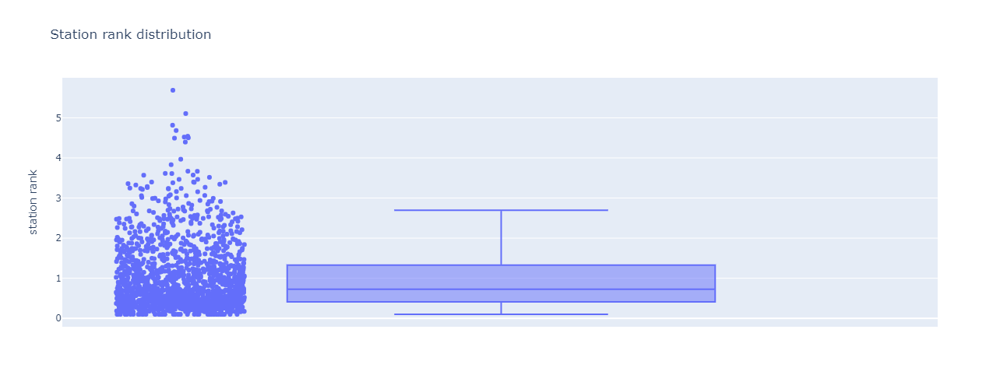

In [7]:
fig = px.box(df_p, y="pagerank", points="all",
                 labels={
                     "pagerank": "station rank",
                 },
                title="Station rank distribution")
fig.update_layout(
    autosize=False,
    width=500,
    height=500,)
fig.show()

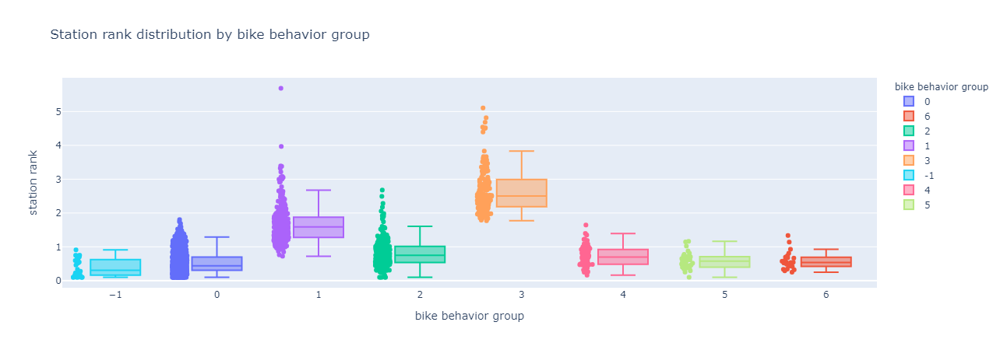

In [8]:
fig = px.box(df_p, y="pagerank", x="bikeBehaviorGroup", color="bikeBehaviorGroup", points="all",
                 labels={
                     "pagerank": "station rank",
                     "bikeBehaviorGroup": "bike behavior group"
                 },
                title="Station rank distribution by bike behavior group")
fig.show()

In [17]:
df_p.describe()

,latitude,longitude,bikeBehaviorGroup,pagerank,pagerank_MI,pagerank_LI
count,1631.000000,1631.000000,1631.000000,1631.000000,1631.000000,1631.000000
mean,40.749076,-73.959720,1.151441,0.992876,0.618640,0.472164
std,0.057707,0.038171,1.464842,0.799416,0.709567,0.659902
min,40.633385,-74.083639,-1.000000,0.100000,0.500000,0.300000
25%,40.704124,-73.988992,0.000000,0.411483,0.500000,0.300000
50%,40.744219,-73.959112,1.000000,0.724413,0.500000,0.300000
75%,40.794533,-73.928283,2.000000,1.327165,0.500000,0.300000
max,40.874440,-73.881876,6.000000,5.687299,7.393488,3.000000


#### Create a pandas dataframe with subway stations

In [9]:

df_subway = pd.read_csv ('/project/ds5559/Summer2021_TeamBike/subway_stations.csv')
df_subway["pagerank"] = 0.2
df_subway["pagerank_MI"] = 0.5
df_subway["pagerank_LI"] = 0.3
#df_subway.head()

In [10]:
# save the pagerank results from 50% sample of trips
df_p = pd.read_csv('results_pagerank50perc.csv')
df_p["bikeBehaviorGroup"] = df_p["bikeBehaviorGroup"].astype(str)
df_p['bikeBehaviorGroupText'] = ['*subway station' if g == 'subway' else "Group: " + g  for g in df_p['bikeBehaviorGroup']] 
df_p = df_p.sort_values(by='bikeBehaviorGroupText', ascending=False)
#df_p.head()
# append subway
df_p_Sample = df_p.append(df_subway)
df_p_Sample["bikeBehaviorGroup"] = df_p_Sample["bikeBehaviorGroup"].astype(str)
df_p_Sample['bikeBehaviorGroupText'] = ['*subway station' if g == 'subway' else "Group: " + g  for g in df_p_Sample['bikeBehaviorGroup']] 
df_p_Sample = df_p_Sample.sort_values(by='bikeBehaviorGroupText', ascending=False)




In [48]:
df_p_Sample.head()

,endStationName,latitude,longitude,bikeBehaviorGroup,pagerank,pagerank_MI,pagerank_LI,bikeBehaviorGroupText
1052,Nelson Ave & 167 St,40.836706,-73.926089,6,0.291159,0.5,0.3,Group: 6
51,Putnam Ave & Knickerbocker Ave,40.695450,-73.911640,6,0.430638,0.5,0.3,Group: 6
1449,E 161 St & Park Ave,40.824811,-73.916407,6,0.677489,0.5,0.3,Group: 6
562,Nelson Ave & W 172 St,40.843965,-73.920999,6,0.928159,0.5,0.3,Group: 6
567,Crotona Park East & E 173 St,40.837037,-73.890413,6,0.603847,0.5,0.3,Group: 6


In [28]:
#pip install plotly

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


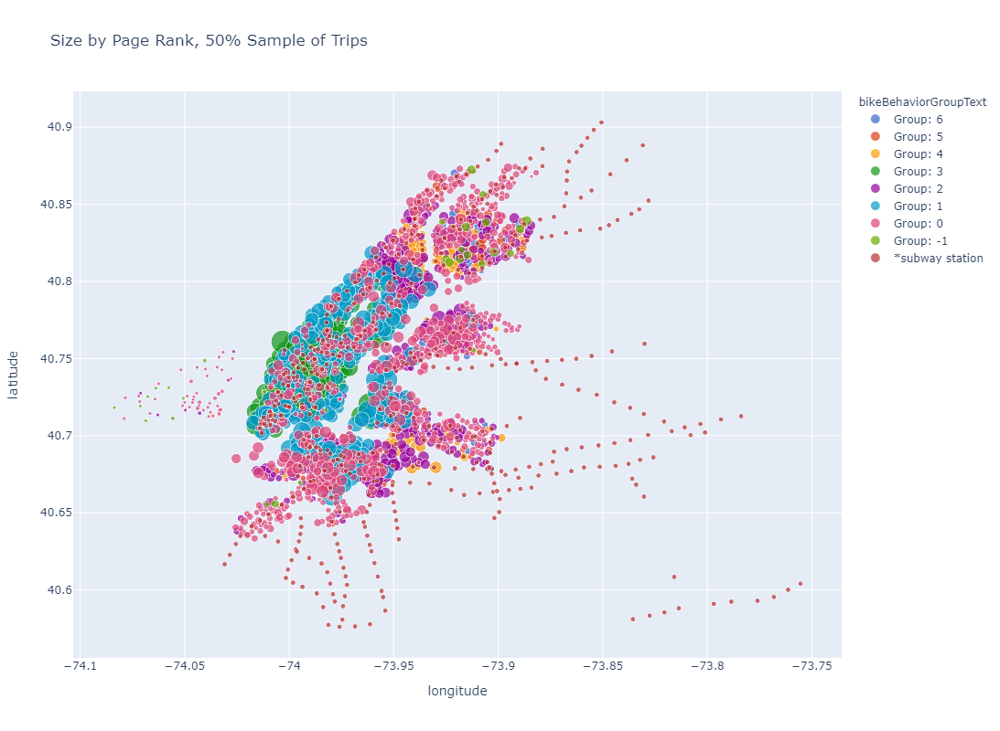

In [52]:
fig = px.scatter(df_p_Sample, x = 'longitude', y = 'latitude', color='bikeBehaviorGroupText', size='pagerank', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroupText','endStationName'], height=800, title='Size by Page Rank, 50% Sample of Trips')
fig.write_image("50PercSample_SizeByPageRankNoSubWay.png")
fig.show()


**Observations:** I was expecting that the highest ranked stations outside of Lower Manhattan would all be associated with a subway station, but that is **not** the case. You can investigate this by zooming in on the plot.

# plot only with pagerank > 3 sized

In [14]:
#df_p['pagerank_MI'] = df_p['pagerank'].apply(lambda x: x * 1.3 if x >= 3 else 0.5)

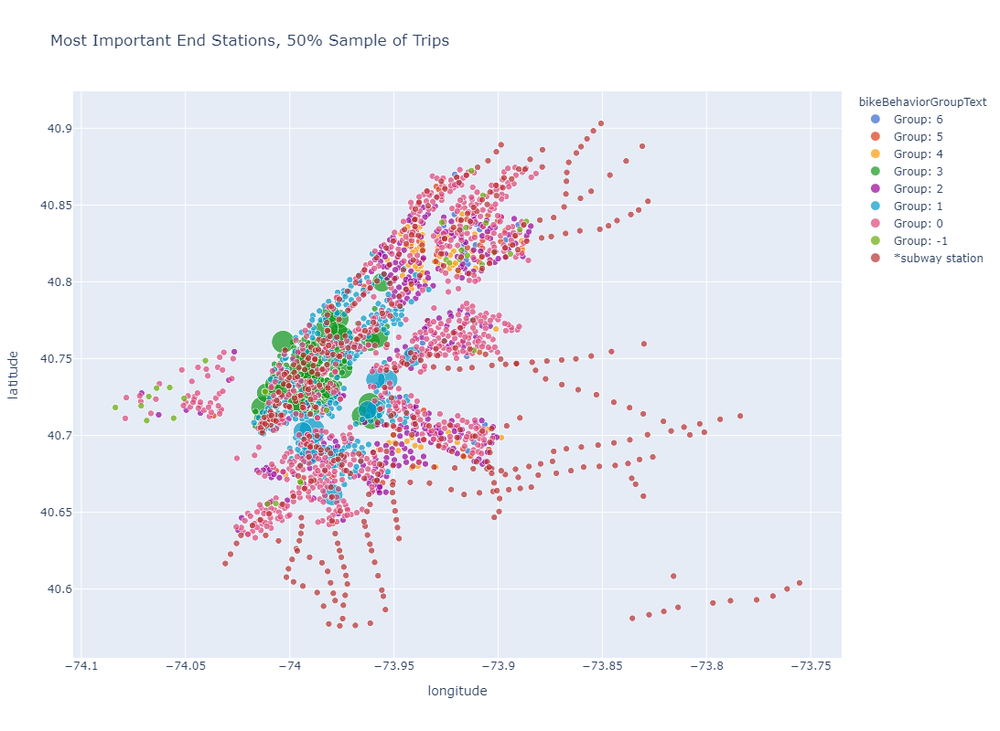

In [11]:
fig = px.scatter(df_p_Sample, x = 'longitude', y = 'latitude', color='bikeBehaviorGroupText', size='pagerank_MI', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroupText','endStationName'], height=800,  title='Most Important End Stations, 50% Sample of Trips')
fig.write_image("50PercSample_SizeMostImportantPageRank.png")
fig.show()

# plot only with pageRank < 0.5 sized

In [17]:
df_p['pagerank_LI'] = df_p['pagerank'].apply(lambda x: 3 if x < 0.2 else 0.3)

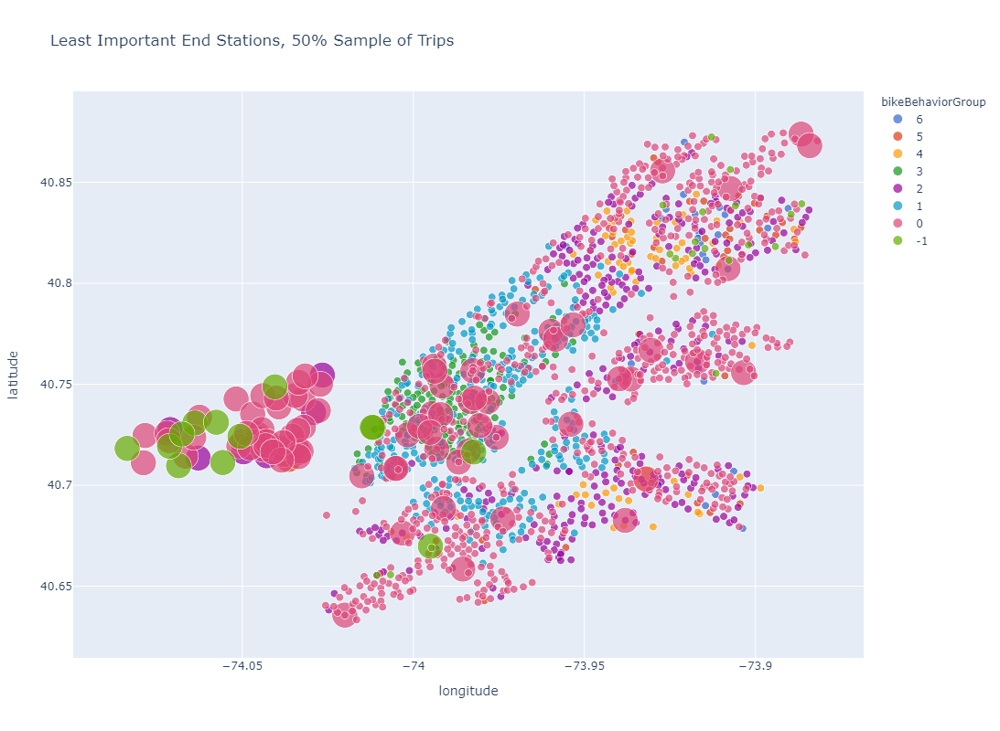

In [20]:
fig = px.scatter(df_p, x = 'longitude', y = 'latitude', color='bikeBehaviorGroup', size='pagerank_LI', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroup','endStationName'], height=800, title='Least Important End Stations, 50% Sample of Trips')
fig.write_image("50PercSample_SizeLeastImportantPageRank.png")
fig.show()

In [23]:
# save the pagerank results from 50% sample of trips
df_p.to_csv ('results_pagerank50perc.csv', index = False, header=True)

## Get the rank for good weather trips

In [6]:
goodWeatherRank = bike_graph.filterEdges("weatherGOODorBAD = 'GOOD'").dropIsolatedVertices().pageRank(resetProbability=0.15, maxIter=10)

In [2]:
schema = StructType([
    StructField("endStationName", StringType(), True),
    StructField("latitude", DoubleType(), True),
    StructField("longitude", DoubleType(), True),
    StructField("bikeBehaviorGroup", IntegerType(), True)
])
df_stations = spark.read.csv("../NonBoroughKModels/endStationNameLatLonNoLocationBikeBehaviorGroup.csv", header=True,schema=schema)
# remove nans and nulls
df_stations = df_stations.filter(df_stations.bikeBehaviorGroup. isNotNull())

In [8]:
ls_MostImportantGoodWeather = goodWeatherRank.vertices.orderBy(goodWeatherRank.vertices.pagerank.desc()).take(1621)
df_pageRankGoodWeather = spark.createDataFrame(ls_MostImportantGoodWeather).select('id','pagerank').withColumnRenamed("id","endStationName")

In [9]:
schema = StructType([
    StructField("endStationName", StringType(), True),
    StructField("latitude", DoubleType(), True),
    StructField("longitude", DoubleType(), True),
    StructField("bikeBehaviorGroup", IntegerType(), True)
])



df_goodWeatherStationRank = df_stations.join(df_pageRankGoodWeather, 'endStationName', 'left')
#print(df_goodWeatherStationRank.count())
#df_goodWeatherStationRank.show(5)
df_p_goodWeatherStationRank = df_goodWeatherStationRank.toPandas()
df_p_goodWeatherStationRank.fillna(0.1, inplace=True)
df_p_goodWeatherStationRank["bikeBehaviorGroup"] = df_p_goodWeatherStationRank["bikeBehaviorGroup"].astype(int).astype(str)
df_p_goodWeatherStationRank = df_p_goodWeatherStationRank.sort_values(by='bikeBehaviorGroup', ascending=False)
#df_p_goodWeatherStationRank.head()

In [10]:
df_p_goodWeatherStationRank['pagerank_MI'] = df_p_goodWeatherStationRank['pagerank'].apply(lambda x: x * 1.3 if x >= 3 else 0.5)

In [11]:
df_p_goodWeatherStationRank.to_csv("50PercSampleGoodWeatherStationRank.csv",header=True,index=False)
#df_p_CovidStationRank.to_csv("30PercSampleCOVIDStationRank.csv",header=True,index=False)

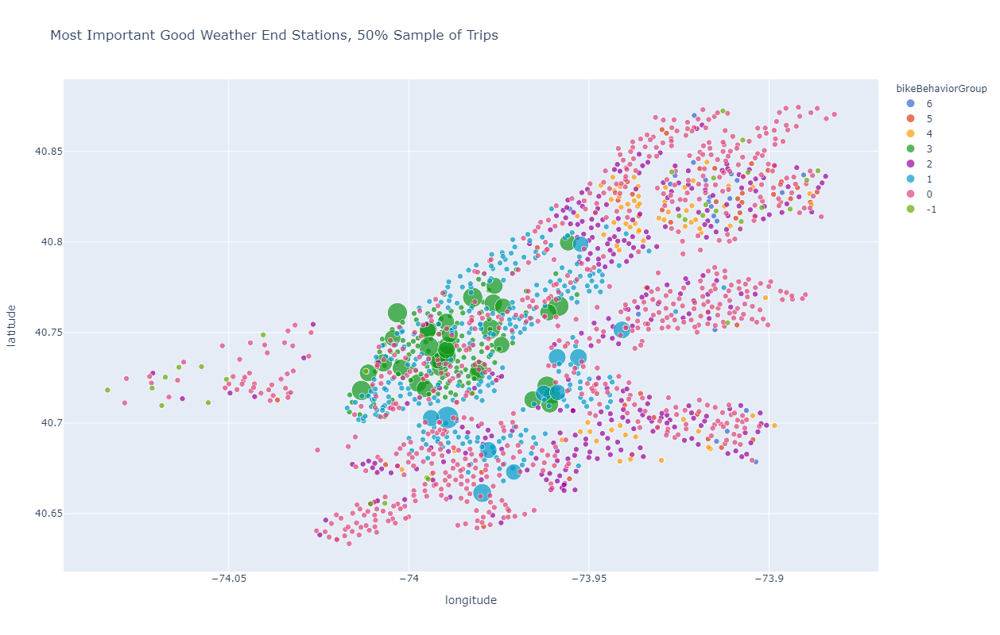

In [12]:
fig = px.scatter(df_p_goodWeatherStationRank, x = 'longitude', y = 'latitude', color='bikeBehaviorGroup', size='pagerank_MI', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroup','endStationName'], height=800,  title='Most Important Good Weather End Stations, 50% Sample of Trips')
fig.write_image("50PercSample_SizeMostImportantGoodWeatherPageRank.png")
fig.show()

## Get rank for bad weather trips

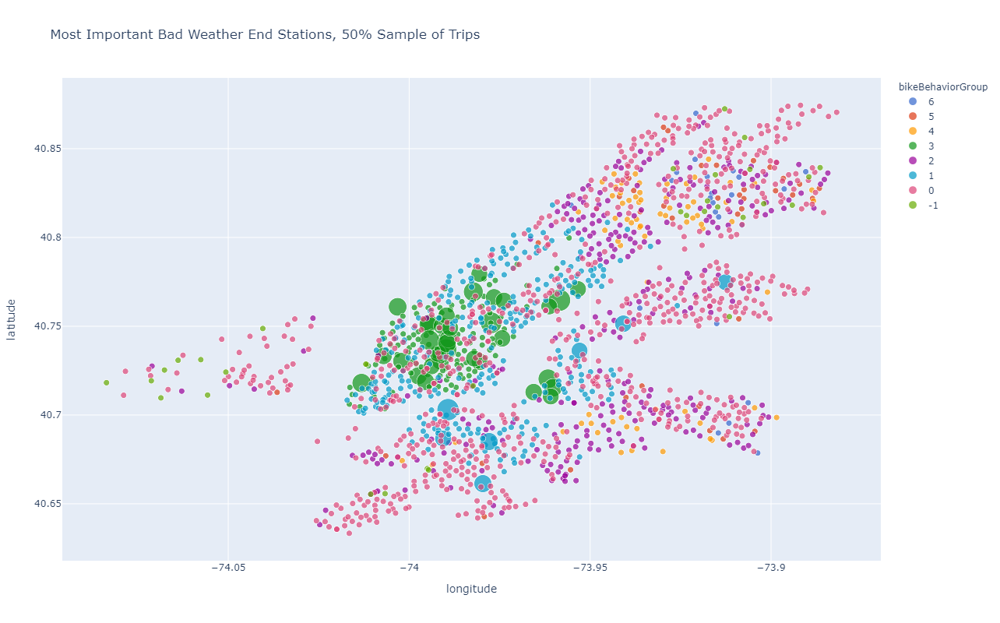

In [13]:
badWeatherRank = bike_graph.filterEdges("weatherGOODorBAD = 'BAD'").dropIsolatedVertices().pageRank(resetProbability=0.15, maxIter=10)
ls_MostImportantBadWeather = badWeatherRank.vertices.orderBy(badWeatherRank.vertices.pagerank.desc()).take(1621)
df_pageRankBadWeather = spark.createDataFrame(ls_MostImportantBadWeather).select('id','pagerank').withColumnRenamed("id","endStationName")

schema = StructType([
    StructField("endStationName", StringType(), True),
    StructField("latitude", DoubleType(), True),
    StructField("longitude", DoubleType(), True),
    StructField("bikeBehaviorGroup", IntegerType(), True)
])

df_badWeatherStationRank = df_stations.join(df_pageRankBadWeather, 'endStationName', 'left')
#print(df_badWeatherStationRank.count())
#df_badWeatherStationRank.show(5)
df_p_badWeatherStationRank = df_badWeatherStationRank.toPandas()
df_p_badWeatherStationRank.fillna(0.1, inplace=True)
df_p_badWeatherStationRank["bikeBehaviorGroup"] = df_p_badWeatherStationRank["bikeBehaviorGroup"].astype(int).astype(str)
df_p_badWeatherStationRank = df_p_badWeatherStationRank.sort_values(by='bikeBehaviorGroup', ascending=False)
#df_p_goodWeatherStationRank.head()
df_p_badWeatherStationRank['pagerank_MI'] = df_p_badWeatherStationRank['pagerank'].apply(lambda x: x * 1.3 if x >= 3 else 0.5)
# save the data
df_p_badWeatherStationRank.to_csv("50PercSampleBadWeatherStationRank.csv",header=True,index=False)
# show the plot
fig = px.scatter(df_p_badWeatherStationRank, x = 'longitude', y = 'latitude', color='bikeBehaviorGroup', size='pagerank_MI', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroup','endStationName'], height=800,  title='Most Important Bad Weather End Stations, 50% Sample of Trips')
fig.write_image("50PercSample_SizeMostImportantBadWeatherPageRank.png")
fig.show()

In [12]:
# Retrieve these files
df_p_GoodWeatherRank = pd.read_csv("50PercSampleGoodWeatherStationRank.csv")
df_p_BadWeatherRank = pd.read_csv("50PercSampleBadWeatherStationRank.csv")

print(df_p_GoodWeatherRank.head())
print(df_p_BadWeatherRank.head())

                   endStationName   latitude  longitude  bikeBehaviorGroup  \
0        Intervale Ave & Kelly St  40.827301 -73.896372                  6   
1        Fairview Ave & Linden St  40.706940 -73.906320                  6   
2         Old Broadway & W 133 St  40.818212 -73.955277                  6   
3                  48 St & 37 Ave  40.751555 -73.915026                  6   
4  Putnam Ave & Knickerbocker Ave  40.695450 -73.911640                  6   

   pagerank  pagerank_MI  
0  0.511711          0.5  
1  0.329395          0.5  
2  0.247583          0.5  
3  0.441183          0.5  
4  0.455243          0.5  
                   endStationName   latitude  longitude  bikeBehaviorGroup  \
0        Intervale Ave & Kelly St  40.827301 -73.896372                  6   
1        Fairview Ave & Linden St  40.706940 -73.906320                  6   
2         Old Broadway & W 133 St  40.818212 -73.955277                  6   
3                  48 St & 37 Ave  40.751555 -73.915026  

#### Findings on Good Weather vs. Bad Weather Station Importance

**Good Weather:**
1. 45 stations had a pagerank greater than 3
    1. 11 of the most important (MI) Good Weather stations were **not** MI during Bad Weather
    1. Good Weather max page rank was 5.73
    1. Top 5 stations were:
        1. Front St & Washington St
        1. 1 Ave & E 68 St
        1. E 17 St & Broadway
        1. West St & Chambers St
        1. 134 Kent Ave & N 7 St
        

**Bad Weather:**
1. 41 stations had a pagerank greater than 3.
    1. 7 of the MI Bad Weather stations were **not** MI in the Good Weather data set.
    1. Bad Weather max page rank was 5.498
    1. Top 5 stations were:
        1. 1 Ave & E 68 St
        1. Front St & Washington St
        1. Pershing Square North
        1. E 17 St & Broadway
        1. W 21 St & 6 Ave
        

In [16]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df_p_GoodWeatherStationRank_MI = df_p_GoodWeatherRank[df_p_GoodWeatherRank['pagerank'] > 3].sort_values(by=['pagerank'], ascending=False).drop_duplicates()
print(df_p_GoodWeatherStationRank_MI.shape)
df_p_GoodWeatherStationRank_MI.head(45)

(45, 6)


,endStationName,latitude,longitude,bikeBehaviorGroup,pagerank,pagerank_MI
586,Front St & Washington St,40.703034,-73.989268,1,5.736211,7.457075
136,1 Ave & E 68 St,40.764670,-73.958457,3,4.875162,6.337710
221,E 17 St & Broadway,40.737033,-73.989729,3,4.699749,6.109674
206,West St & Chambers St,40.718032,-74.013147,3,4.646259,6.040137
134,Kent Ave & N 7 St,40.720368,-73.961651,3,4.629778,6.018712
153,12 Ave & W 40 St,40.760917,-74.003185,3,4.596733,5.975753
192,Broadway & W 60 St,40.769437,-73.982279,3,4.516353,5.871258
139,Pershing Square North,40.751936,-73.977353,3,4.449120,5.783856
237,W 21 St & 6 Ave,40.742160,-73.994437,3,4.427156,5.755303
788,West Drive & Prospect Park West,40.661375,-73.979635,1,4.050747,5.265971


In [18]:
df_p_BadWeatherStationRank_MI = df_p_BadWeatherRank[df_p_BadWeatherRank['pagerank'] > 3].sort_values(by=['pagerank'], ascending=False).drop_duplicates()
print(df_p_BadWeatherStationRank_MI.shape)
df_p_BadWeatherStationRank_MI.head(41)

(41, 6)


,endStationName,latitude,longitude,bikeBehaviorGroup,pagerank,pagerank_MI
136,1 Ave & E 68 St,40.764670,-73.958457,3,5.498624,7.148211
586,Front St & Washington St,40.703034,-73.989268,1,5.359457,6.967294
139,Pershing Square North,40.751936,-73.977353,3,5.120404,6.656525
221,E 17 St & Broadway,40.737033,-73.989729,3,4.948617,6.433202
237,W 21 St & 6 Ave,40.742160,-73.994437,3,4.688316,6.094811
192,Broadway & W 60 St,40.769437,-73.982279,3,4.306650,5.598644
134,Kent Ave & N 7 St,40.720368,-73.961651,3,4.263650,5.542745
206,West St & Chambers St,40.718032,-74.013147,3,4.104418,5.335744
218,Broadway & E 14 St,40.734364,-73.991161,3,3.895509,5.064162
252,Broadway & E 22 St,40.740343,-73.989551,3,3.827080,4.975204


### Determine unique to Good Weather and Bad Weather

In [19]:
dfs_dictionary = {'MI Unique To Good Weather':df_p_GoodWeatherStationRank_MI.drop(['pagerank','pagerank_MI'],axis=1),'MI Unique To Bad Weather':df_p_BadWeatherStationRank_MI.drop(['pagerank','pagerank_MI'], axis=1)}
df=pd.concat(dfs_dictionary)
df = df.drop_duplicates(keep=False)
df.to_csv("UniqueGoodAndBadWeather.csv")
df

endStationName  \
MI Unique To Good Weather 241                    Pier 40 - Hudson River Park   
                          566                        Franklin St & Dupont St   
                          202                    Central Park West & W 72 St   
                          162  Central Park North & Adam Clayton Powell Blvd   
                          150                             E 10 St & Avenue A   
                          694                                  Old Fulton St   
                          828                           N 6 St & Bedford Ave   
                          678                           Lenox Ave & W 111 St   
                          584                   Wythe Ave & Metropolitan Ave   
                          656               Grand Army Plaza & Plaza St West   
                          275                               W 22 St & 10 Ave   
MI Unique To Bad Weather  173                                W 33 St & 7 Ave   
                          618                           Bergen St & Smith St   
                          258                                1 Ave & E 16 St   
                          227                                 Great Jones St   
                          235                                1 Ave & E 78 St   
                          808                                 31 St & 23 Ave   
                          185                        Amsterdam Ave & W 73 St   

                                latitude  longitude  bikeBehaviorGroup  
MI Unique To Good Weather 241  40.727714 -74.011296                  3  
                          566  40.736320 -73.958830                  1  
                          202  40.775794 -73.976206                  3  
                          162  40.799742 -73.955806                  3  
                          150  40.727605 -73.980947                  3  
                          694  40.702772 -73.993836                  1  
                          828  40.716968 -73.958673                  1  
                          678  40.798786 -73.952300                  1  
                          584  40.716443 -73.962599                  1  
                          656  40.672968 -73.970880                  1  
                          275  40.746920 -74.004519                  3  
MI Unique To Bad Weather  173  40.750200 -73.990931                  3  
                          618  40.686744 -73.990632                  1  
                          258  40.731813 -73.982104                  3  
                          227  40.727434 -73.993790                  3  
                          235  40.770936 -73.953345                  3  
                          808  40.774788 -73.912555                  1  
                          185  40.779445 -73.980620                  3

In [39]:
df_uniqueToGoodWeather = df.loc['MI Unique To Good Weather'][['endStationName','latitude','longitude']]
# set pageRank = 7 so that these stations are shown large
df_uniqueToGoodWeather['pageRank'] = 1.5
df_uniqueToGoodWeather['colorGroup'] = 'MI Unique To Good Weather'

# get all the stations
df_appendToGoodWeather = df_p_GoodWeatherRank.loc[:, ['endStationName','latitude','longitude']]
df_appendToGoodWeather['pageRank'] = 0.1
df_appendToGoodWeather['colorGroup'] = 'CitiBike Station'


# append the two dataframes
df_GoodWeatherMapping = df_appendToGoodWeather.append(df_uniqueToGoodWeather)

# add subway stations
#df_subway = pd.read_csv ('/project/ds5559/Summer2021_TeamBike/subway_stations.csv')
#df_subway["pageRank"] = 0.2
#df_subway['colorGroup'] = '*Subway Station'
#df_subway.head()
# append subway
#df_GoodWeatherMapping = df_GoodWeatherMapping.append(df_subway)
df_GoodWeatherMapping = df_GoodWeatherMapping.sort_values(by='colorGroup', ascending=True)

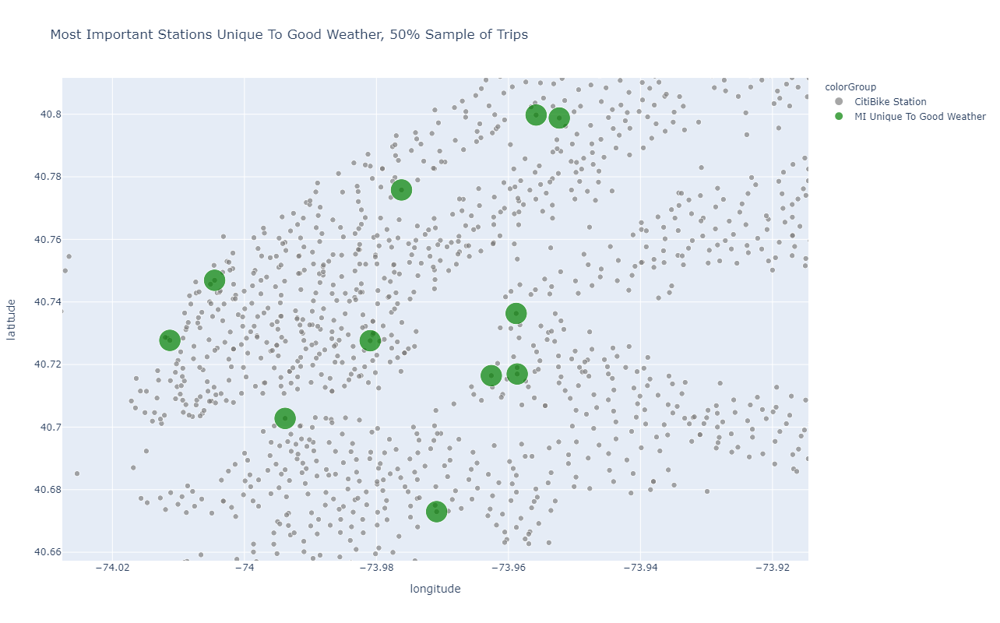

In [40]:
# show the plot
fig = px.scatter(df_GoodWeatherMapping, x = 'longitude', y = 'latitude', color='colorGroup', color_discrete_sequence=["gray",'green'],\
                size='pageRank', height=800,  title='Most Important Stations Unique To Good Weather, 50% Sample of Trips')
fig.write_image("50PercSample_MIUniqueGoodWeatherPageRank.png")
fig.show()

In [41]:
df_uniqueToBadWeather = df.loc['MI Unique To Bad Weather'][['endStationName','latitude','longitude']]
# set pageRank = 7 so that these stations are shown large
df_uniqueToBadWeather['pageRank'] = 1.5
df_uniqueToBadWeather['colorGroup'] = 'MI Unique To Bad Weather'

# get all the stations
df_appendToBadWeather = df_p_BadWeatherRank.loc[:, ['endStationName','latitude','longitude']]
df_appendToBadWeather['pageRank'] = 0.1
df_appendToBadWeather['colorGroup'] = 'CitiBike Station'


# append the two dataframes
df_BadWeatherMapping = df_appendToBadWeather.append(df_uniqueToBadWeather)

#df_subway.head()
# append subway
#df_BadWeatherMapping = df_BadWeatherMapping.append(df_subway)
df_BadWeatherMapping = df_BadWeatherMapping.sort_values(by='colorGroup', ascending=True)

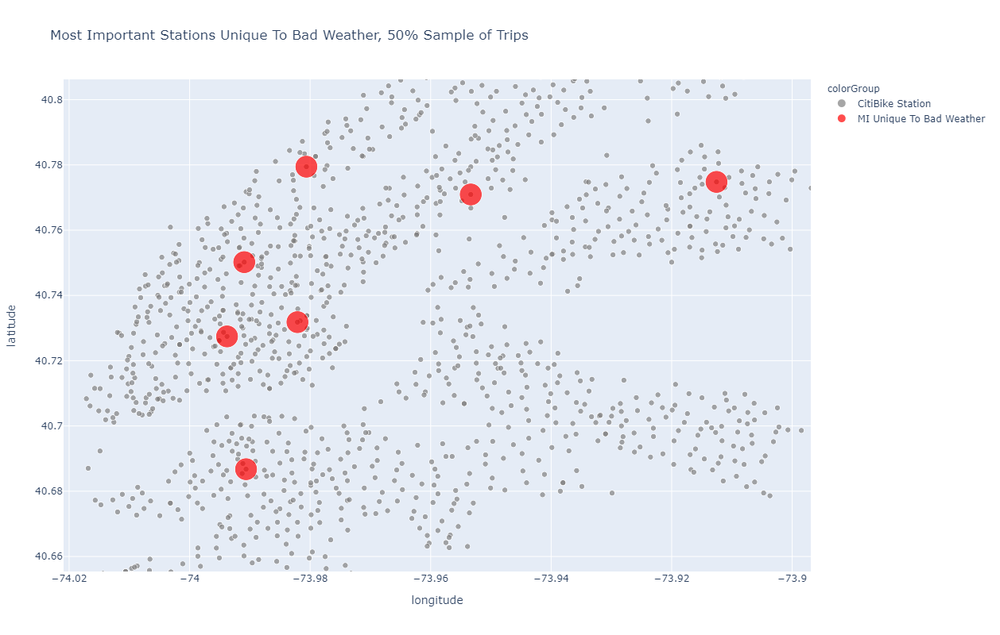

In [42]:
# show the plot
fig = px.scatter(df_BadWeatherMapping, x = 'longitude', y = 'latitude', color='colorGroup', color_discrete_sequence=["gray",'red'],\
                size='pageRank', height=800,  title='Most Important Stations Unique To Bad Weather, 50% Sample of Trips')
fig.write_image("50PercSample_MIUniqueBadWeatherPageRank.png")
fig.show()

# NEED TO DO: Observations of good weather and bad weather important stations:



## Compare most important stations March 2019 - Feb 2020 vs. March 2020 - Feb 2021

In [24]:
schema = StructType([
    StructField("endStationName", StringType(), True),
    StructField("latitude", DoubleType(), True),
    StructField("longitude", DoubleType(), True),
    StructField("bikeBehaviorGroup", IntegerType(), True)
])
df_stations = spark.read.csv("../NonBoroughKModels/endStationNameLatLonNoLocationBikeBehaviorGroup.csv", header=True,schema=schema)
# remove nans and nulls
df_stations = df_stations.filter(df_stations.bikeBehaviorGroup. isNotNull())

In [4]:
# load vertices
verts_for_date = spark.read.csv('/project/ds5559/Summer2021_TeamBike/gnnData-vertices.csv', header=True)
# load edges with 'src','dst','time_bin','peak_commute','dow','weatherGOODorBAD'
edges_for_date_precovid = spark.read.csv('/project/ds5559/Summer2021_TeamBike/gnnData-edges.csv', header=True).filter("date > '2019-02-28' and date < '2020-03-01'")
edges_for_date_covid = spark.read.csv('/project/ds5559/Summer2021_TeamBike/gnnData-edges.csv', header=True).filter("date > '2020-02-28' and date < '2021-03-01'")

edges_for_date_precovid_sample = edges_for_date_precovid.sample(0.3, 3)
edges_for_date_covid_sample = edges_for_date_covid.sample(0.3, 3)

In [5]:
verts_for_date.cache()
verts_for_date.count()

2670

In [6]:
edges_for_date_precovid_sample.cache()
edges_for_date_precovid_sample.count()

5408777

In [7]:
edges_for_date_covid_sample.cache()
edges_for_date_covid_sample.count()

4920101

In [8]:
precovid_bike_graph = GraphFrame(verts_for_date, edges_for_date_precovid_sample)

In [9]:
rank_precovid = precovid_bike_graph.dropIsolatedVertices().pageRank(resetProbability=0.15, maxIter=10)

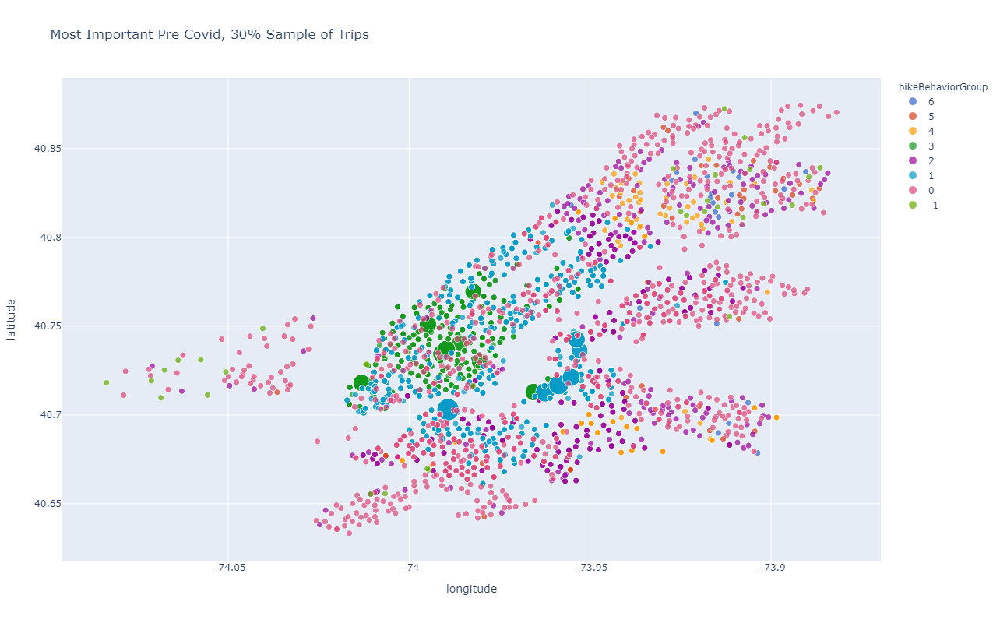

In [10]:
ls_MI_precovid = rank_precovid.vertices.orderBy(rank_precovid.vertices.pagerank.desc()).take(1631)
df_rankPreCovid = spark.createDataFrame(ls_MI_precovid).select('id','pagerank').withColumnRenamed("id","endStationName")

schema = StructType([
    StructField("endStationName", StringType(), True),
    StructField("latitude", DoubleType(), True),
    StructField("longitude", DoubleType(), True),
    StructField("bikeBehaviorGroup", IntegerType(), True)
])

df_PreCovidStationRank = df_stations.join(df_rankPreCovid, 'endStationName', 'left')

df_p_PreCovidStationRank = df_PreCovidStationRank.toPandas()
df_p_PreCovidStationRank.fillna(0.1, inplace=True)
df_p_PreCovidStationRank["bikeBehaviorGroup"] = df_p_PreCovidStationRank["bikeBehaviorGroup"].astype(int).astype(str)
df_p_PreCovidStationRank = df_p_PreCovidStationRank.sort_values(by='bikeBehaviorGroup', ascending=False)

df_p_PreCovidStationRank['pagerank_MI'] = df_p_PreCovidStationRank['pagerank'].apply(lambda x: x * 1.3 if x >= 3 else 0.5)
# show the plot
fig = px.scatter(df_p_PreCovidStationRank, x = 'longitude', y = 'latitude', color='bikeBehaviorGroup', size='pagerank_MI', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroup','endStationName'], height=800,  title='Most Important Pre Covid, 30% Sample of Trips')
fig.write_image("30PercSample_SizeMostImportantPreCovidPageRank.png")
fig.show()

In [ ]:
# show the plot
fig = px.scatter(df_p_PreCovidStationRank, x = 'longitude', y = 'latitude', color='bikeBehaviorGroup', size='pagerank', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroup','endStationName'], height=800,  title='Stations By Rank Pre Covid, 30% Sample of Trips')
fig.write_image("30PercSample_SizeByPreCovidPageRank.png")
fig.show()

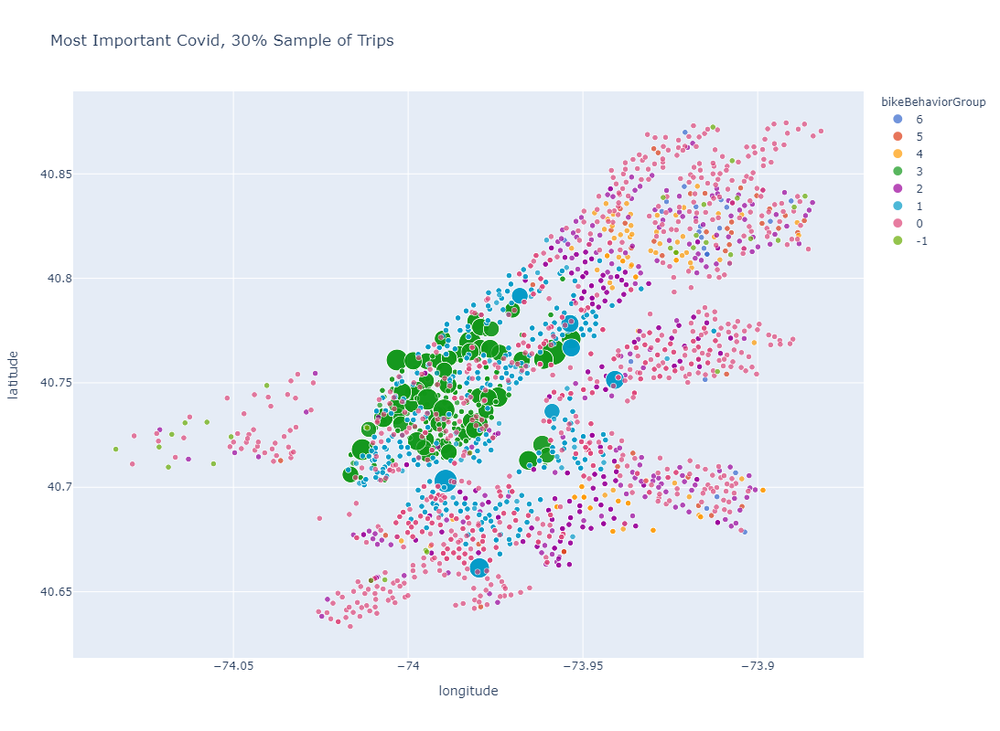

In [11]:
covid_bike_graph = GraphFrame(verts_for_date, edges_for_date_covid_sample)
rank_covid = covid_bike_graph.dropIsolatedVertices().pageRank(resetProbability=0.15, maxIter=10)
ls_MI_covid = rank_covid.vertices.orderBy(rank_covid.vertices.pagerank.desc()).take(1631)
df_rankCovid = spark.createDataFrame(ls_MI_covid).select('id','pagerank').withColumnRenamed("id","endStationName")

schema = StructType([
    StructField("endStationName", StringType(), True),
    StructField("latitude", DoubleType(), True),
    StructField("longitude", DoubleType(), True),
    StructField("bikeBehaviorGroup", IntegerType(), True)
])

df_CovidStationRank = df_stations.join(df_rankCovid, 'endStationName', 'left')

df_p_CovidStationRank = df_CovidStationRank.toPandas()
df_p_CovidStationRank.fillna(0.1, inplace=True)
df_p_CovidStationRank["bikeBehaviorGroup"] = df_p_CovidStationRank["bikeBehaviorGroup"].astype(int).astype(str)
df_p_CovidStationRank = df_p_CovidStationRank.sort_values(by='bikeBehaviorGroup', ascending=False)

df_p_CovidStationRank['pagerank_MI'] = df_p_CovidStationRank['pagerank'].apply(lambda x: x * 1.3 if x >= 3 else 0.5)
# show the plot
fig = px.scatter(df_p_CovidStationRank, x = 'longitude', y = 'latitude', color='bikeBehaviorGroup', size='pagerank_MI', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroup','endStationName'], height=800,  title='Most Important Covid, 30% Sample of Trips')
fig.write_image("30PercSample_SizeMostImportantCovidPageRank.png")
fig.show()

In [ ]:
fig = px.scatter(df_p_CovidStationRank, x = 'longitude', y = 'latitude', color='bikeBehaviorGroup', size='pagerank', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroup','endStationName'], height=800,  title='Stations By Rank Covid, 30% Sample of Trips')
fig.write_image("30PercSample_SizeByCovidPageRank.png")
fig.show()

In [ ]:
print("Trips in Pre-COVID 30% sample: ",edges_for_date_precovid_sample.count())
print("Trips in COVID 30% sample: ",edges_for_date_covid_sample.count())


### Which stations are different from pre-covid, vs. covid?

Save the dataframes with most important pre-covid and most important covid:

In [12]:
#df_p_PreCovidStationRank.to_csv("30PercSamplePreCOVIDStationRank.csv",header=True,index=False)
#df_p_CovidStationRank.to_csv("30PercSampleCOVIDStationRank.csv",header=True,index=False)

In [2]:
# Retrieve these files
df_p_PreCovidStationRank = pd.read_csv("30PercSamplePreCOVIDStationRank.csv")
df_p_CovidStationRank = pd.read_csv("30PercSampleCOVIDStationRank.csv")

print(df_p_PreCovidStationRank.head())
print(df_p_CovidStationRank.head())

               endStationName   latitude  longitude  bikeBehaviorGroup  \
0   Washington Ave & E 163 St  40.824000 -73.910890                  6   
1         Nelson Ave & 167 St  40.836706 -73.926089                  6   
2        Brook Ave & E 148 St  40.814383 -73.915368                  6   
3              21 St & 36 Ave  40.760185 -73.936273                  6   
4  Grand Concourse & E 167 St  40.834263 -73.917641                  6   

   pagerank  pagerank_MI  
0       0.1          0.5  
1       0.1          0.5  
2       0.1          0.5  
3       0.1          0.5  
4       0.1          0.5  
                   endStationName   latitude  longitude  bikeBehaviorGroup  \
0  Putnam Ave & Knickerbocker Ave  40.695450 -73.911640                  6   
1        St. Ann's Ave & E 144 St  40.811556 -73.914466                  6   
2      Grand Concourse & E 167 St  40.834263 -73.917641                  6   
3        Southern Blvd & E 142 St  40.806988 -73.908049                  6   
4  

#### Findings on Pre-COVID vs. COVID

**Pre-COVID:**
1. 14 stations had a pagerank greater than 3
    1. 6 of the most important (MI) pre-COVID stations were **not** MI during COVID
    1. Pre-COVID max page rank was 6.97
    1. Top 5 stations were:
        1. Front St & Washington St
        1. N 6 St & Bedford Ave
        1. S 3 St & Bedford Ave
        1. N 12 St & Bedford Ave
        1. E 17 St & Broadway

**During COVID:**
1. 63 stations had a pagerank greater than 3.
    1. 55 of the MI COVID stations were **not** MI in the pre-COVID data set.
    1. COVID max page rank was 10.71
    1. Top 5 stations were:
        1. 1 Ave & E 68 St
        1. E 13 St & Avenue A
        1. 	Front St & Washington St
        1. Broadway & W 60 St
        1. W 21 St & 6 Ave


In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df_p_PreCovidStationRank_MI = df_p_PreCovidStationRank[df_p_PreCovidStationRank['pagerank'] > 3].sort_values(by=['pagerank'], ascending=False).drop_duplicates()
print(df_p_PreCovidStationRank_MI.shape)
df_p_PreCovidStationRank_MI.head(14)

(14, 6)


,endStationName,latitude,longitude,bikeBehaviorGroup,pagerank,pagerank_MI
1243,Front St & Washington St,40.703034,-73.989268,1,5.364898,6.974368
1425,N 6 St & Bedford Ave,40.716968,-73.958673,1,4.113610,5.347692
996,S 3 St & Bedford Ave,40.712737,-73.962429,1,4.075652,5.298347
1545,N 12 St & Bedford Ave,40.721199,-73.955231,1,3.459948,4.497933
436,E 17 St & Broadway,40.737033,-73.989729,3,3.431381,4.460795
1368,Vernon Blvd & 50 Ave,40.742551,-73.953745,1,3.295848,4.284602
435,West St & Chambers St,40.718032,-74.013147,3,3.208995,4.171694
221,8 Ave & W 31 St,40.751057,-73.994790,3,3.178441,4.131973
265,S 4 St & Wythe Ave,40.712906,-73.965602,3,3.135221,4.075788
241,Broadway & W 60 St,40.769437,-73.982279,3,3.077947,4.001332


In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df_p_CovidStationRank_MI = df_p_CovidStationRank[df_p_CovidStationRank['pagerank'] > 3].sort_values(by=['pagerank'], ascending=False).drop_duplicates()
print(df_p_CovidStationRank_MI.shape)
df_p_CovidStationRank_MI.head()

(63, 6)


,endStationName,latitude,longitude,bikeBehaviorGroup,pagerank,pagerank_MI
196,1 Ave & E 68 St,40.764670,-73.958457,3,8.241743,10.714266
284,E 13 St & Avenue A,40.729972,-73.980483,3,7.057815,9.175159
1189,Front St & Washington St,40.703034,-73.989268,1,6.349259,8.254037
159,Broadway & W 60 St,40.769437,-73.982279,3,6.225051,8.092566
404,W 21 St & 6 Ave,40.742160,-73.994437,3,5.755790,7.482527


In [5]:
dfs_dictionary = {'MI Unquie to Pre COVID':df_p_PreCovidStationRank_MI.drop(['pagerank','pagerank_MI'],axis=1),'MI Unique To COVID':df_p_CovidStationRank_MI.drop(['pagerank','pagerank_MI'], axis=1)}
df=pd.concat(dfs_dictionary)
df = df.drop_duplicates(keep=False)
df.to_csv("UniquePreCOVIDAndCOVID.csv")
df

endStationName   latitude  \
MI Unquie to Pre COVID 1425               N 6 St & Bedford Ave  40.716968   
                       996                S 3 St & Bedford Ave  40.712737   
                       1545              N 12 St & Bedford Ave  40.721199   
                       1368               Vernon Blvd & 50 Ave  40.742551   
                       384                E 24 St & Park Ave S  40.740482   
                       1027         McGuinness Blvd & Eagle St  40.736275   
MI Unique To COVID     196                     1 Ave & E 68 St  40.764670   
                       404                     W 21 St & 6 Ave  40.742160   
                       212                    12 Ave & W 40 St  40.760917   
                       1272    West Drive & Prospect Park West  40.661375   
                       354                     E 33 St & 1 Ave  40.743151   
                       333       Christopher St & Greenwich St  40.733277   
                       469                     1 Ave & E 62 St  40.761151   
                       313                     1 Ave & E 78 St  40.770936   
                       1482   Queens Plaza North & Crescent St  40.751401   
                       371              Central Park S & 6 Ave  40.766273   
                       268             University Pl & E 14 St  40.734580   
                       343            Cleveland Pl & Spring St  40.722069   
                       289                   Kent Ave & N 7 St  40.720368   
                       1249                 E 72 St & York Ave  40.766759   
                       249             Amsterdam Ave & W 73 St  40.779445   
                       476                  E 10 St & Avenue A  40.727605   
                       501                     9 Ave & W 22 St  40.745665   
                       1573                    E 85 St & 3 Ave  40.778341   
                       344                     6 Ave & W 33 St  40.749009   
                       303                  Broadway & W 56 St  40.764843   
                       338                    11 Ave & W 41 St  40.760534   
                       187                    W 4 St & 7 Ave S  40.734007   
                       379                     2 Ave & E 31 St  40.742939   
                       178               Greenwich Ave & 8 Ave  40.739345   
                       360   Grand Army Plaza & Central Park S  40.764265   
                       282              Columbus Ave & W 72 St  40.776705   
                       226                     E 58 St & 3 Ave  40.760972   
                       297                     8 Ave & W 52 St  40.763805   
                       327                     E 31 St & 3 Ave  40.743629   
                       292               Little West St & 1 Pl  40.706129   
                       156                   E 7 St & Avenue A  40.725812   
                       1194             Columbus Ave & W 95 St  40.791637   
                       467               Forsyth St & Canal St  40.715877   
                       448                     W 41 St & 8 Ave  40.755937   
                       401              Norfolk St & Broome St  40.716818   
                       205                    W 43 St & 10 Ave  40.760396   
                       463               Lafayette St & E 8 St  40.730471   
                       180                    11 Ave & W 59 St  40.771129   
                       436                     1 Ave & E 16 St  40.731813   
                       263          7 Ave & Central Park South  40.766827   
                       148                 Mott St & Prince St  40.722787   
                       377                     E 23 St & 1 Ave  40.736668   
                       302                     W 15 St & 7 Ave  40.739570   
                       290             Allen St & Rivington St  40.719797   
                       493             Grand St & Elizabeth St  40.718911   
                       277                  

#### Map the Unique to Pre-COVID

In [19]:
df_uniqueToPreCOVID = df.loc['MI Unquie to Pre COVID'][['endStationName','latitude','longitude']]
# set pageRank = 7 so that these stations are shown large
df_uniqueToPreCOVID['pageRank'] = 1.5
df_uniqueToPreCOVID['colorGroup'] = 'Unique MI to Pre COVID'

# get all the stations
df_appendToPreCOVID = df_p_PreCovidStationRank.loc[:, ['endStationName','latitude','longitude']]
df_appendToPreCOVID['pageRank'] = 0.1
df_appendToPreCOVID['colorGroup'] = 'CitiBike Station'


# append the two dataframes
df_PreCOVIDMapping = df_appendToPreCOVID.append(df_uniqueToPreCOVID)

# add subway stations
df_subway = pd.read_csv ('/project/ds5559/Summer2021_TeamBike/subway_stations.csv')
df_subway["pageRank"] = 0.2
df_subway['colorGroup'] = '*Subway Station'
#df_subway.head()
# append subway
df_PreCOVIDMapping = df_PreCOVIDMapping.append(df_subway)
df_PreCOVIDMapping = df_PreCOVIDMapping.sort_values(by='colorGroup', ascending=False)




In [82]:
df_PreCOVIDMapping.head()

,endStationName,latitude,longitude,pageRank,colorGroup,bikeBehaviorGroup,pagerank
1027,McGuinness Blvd & Eagle St,40.736275,-73.952920,7.0,Unique MI to Pre COVID,NaN,NaN
384,E 24 St & Park Ave S,40.740482,-73.986011,7.0,Unique MI to Pre COVID,NaN,NaN
1368,Vernon Blvd & 50 Ave,40.742551,-73.953745,7.0,Unique MI to Pre COVID,NaN,NaN
1545,N 12 St & Bedford Ave,40.721199,-73.955231,7.0,Unique MI to Pre COVID,NaN,NaN
996,S 3 St & Bedford Ave,40.712737,-73.962429,7.0,Unique MI to Pre COVID,NaN,NaN


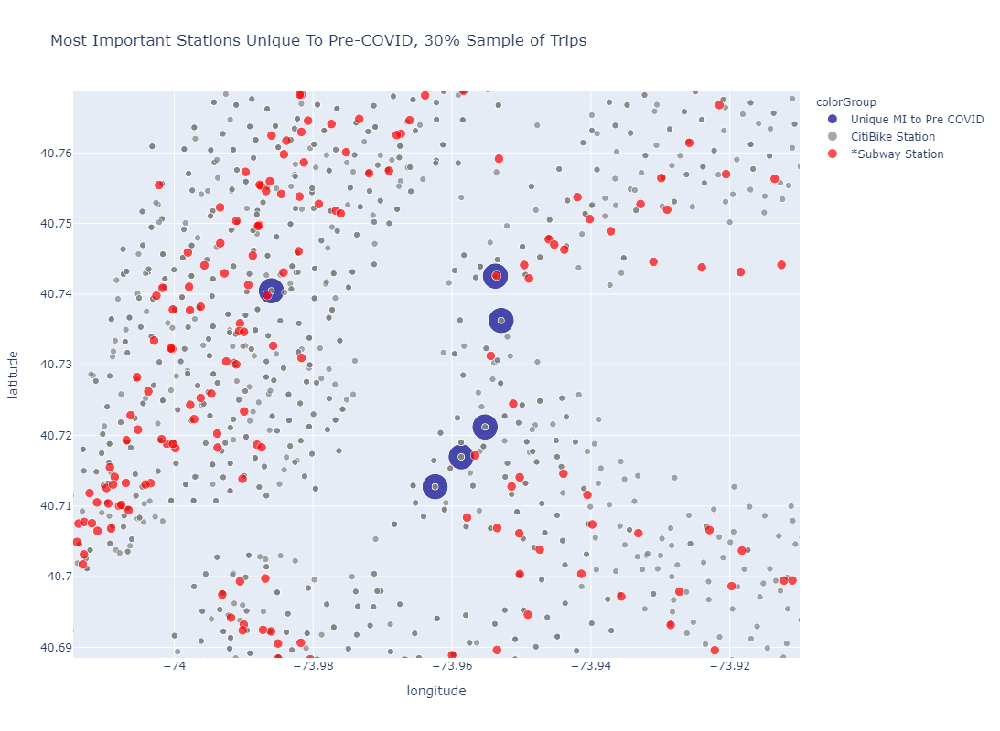

In [20]:
# show the plot
fig = px.scatter(df_PreCOVIDMapping, x = 'longitude', y = 'latitude', color='colorGroup', color_discrete_sequence=["darkblue", "gray",'red'],\
                size='pageRank', height=800,  title='Most Important Stations Unique To Pre-COVID, 30% Sample of Trips')
fig.write_image("30PercSample_MIUniquePreCovidPageRank.png")
fig.show()

**Observation:** 33%, or two of the six unique-to-pre-COVID high-rank bike stations are directly at a subway station.

#### Map the Unique to COVID

In [23]:
df_uniqueToCOVID = df.loc['MI Unique To COVID'][['endStationName','latitude','longitude']]
# set pageRank = 7 so that these stations are shown large
df_uniqueToCOVID['pageRank'] = 1.5
df_uniqueToCOVID['colorGroup'] = 'MI Unique To COVID'

# append the two dataframes
df_COVIDMapping = df_appendToPreCOVID.append(df_uniqueToCOVID)

# add subway stations
df_subway = pd.read_csv ('/project/ds5559/Summer2021_TeamBike/subway_stations.csv')
df_subway["pageRank"] = 0.2
df_subway['colorGroup'] = '*Subway Station'
#df_subway.head()
# append subway
df_COVIDMapping = df_COVIDMapping.append(df_subway)
df_COVIDMapping = df_COVIDMapping.sort_values(by='colorGroup', ascending=False)

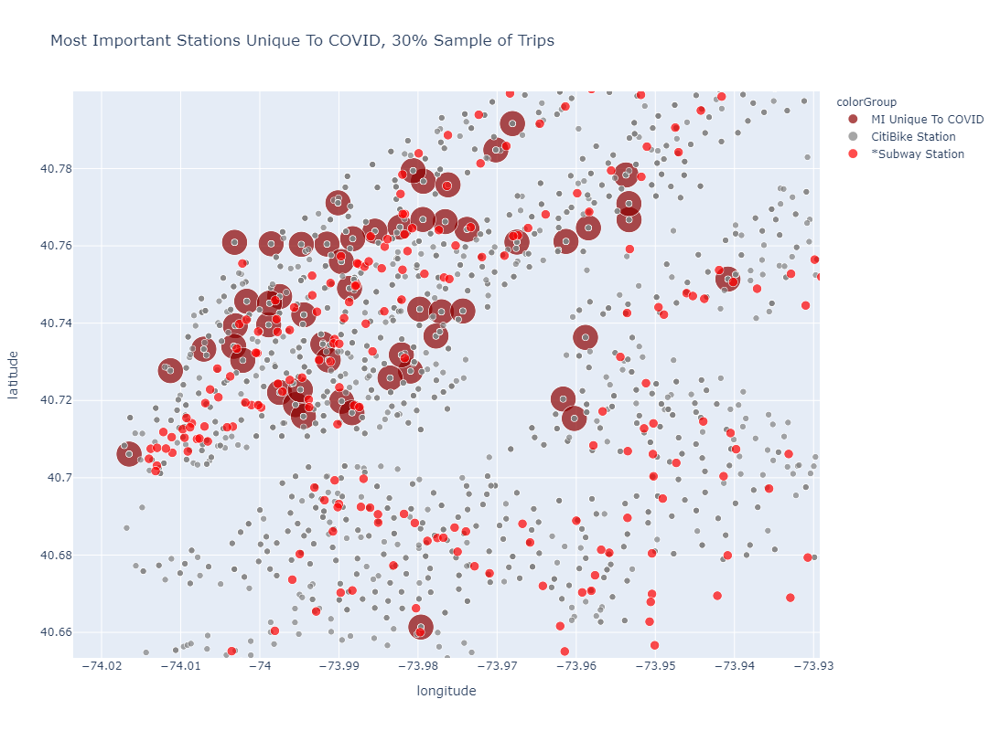

In [24]:
# show the plot
fig = px.scatter(df_COVIDMapping, x = 'longitude', y = 'latitude', color='colorGroup', color_discrete_sequence=["darkred", "gray","red"],
                 size='pageRank', hover_data=['endStationName'], height=800,  title='Most Important Stations Unique To COVID, 30% Sample of Trips')
fig.write_image("30PercSample_MIUniqueCovidPageRank.png")
fig.update_layout(xaxis=dict(range=[-74.08364,-73.88188]))
fig.update_layout(yaxis=dict(range=[40.63339,40.87444]))
fig.show()

**Observation:** 25%, or 14 of the 55 unique-to-COVID high-rank bike stations are directly at a subway station.

# For April 2018 - Oct, 15 2018, in the Evening and Night time bins, what is the rank of the Citi Bike stations nearest Nacho Mama's restaruant?
* Nacho Mama's: 1268 Amsterdam Ave
* Nearest Station: Amsterdam Ave & Morningside Dr

In [9]:
# load vertices
verts_for_nachos = spark.read.csv('/project/ds5559/Summer2021_TeamBike/gnnData-vertices.csv', header=True)
# load edges with 'src','dst','time_bin','peak_commute','dow','weatherGOODorBAD'
edges_for_nachos = spark.read.csv('/project/ds5559/Summer2021_TeamBike/gnnData-edges.csv', header=True).filter("date >= '2018-04-01' and date <= '2018-10-15' and time_bin != 'Morning' and time_bin !='Afternoon'")

In [10]:
edges_for_nachos.groupBy('time_bin').count().show()

+--------+-------+
|time_bin|  count|
+--------+-------+
| Evening|1399398|
|   Night| 265415|
+--------+-------+



In [11]:
verts_for_nachos.cache()
print("Verts Count: ",verts_for_nachos.count())
edges_for_nachos.cache()
print("Edges Count: ",edges_for_nachos.count())

Verts Count:  2670
Edges Count:  1664813


In [12]:
nacho_graph = GraphFrame(verts_for_nachos, edges_for_nachos)

In [13]:
rank_nachos = nacho_graph.dropIsolatedVertices().pageRank(resetProbability=0.15, maxIter=10)

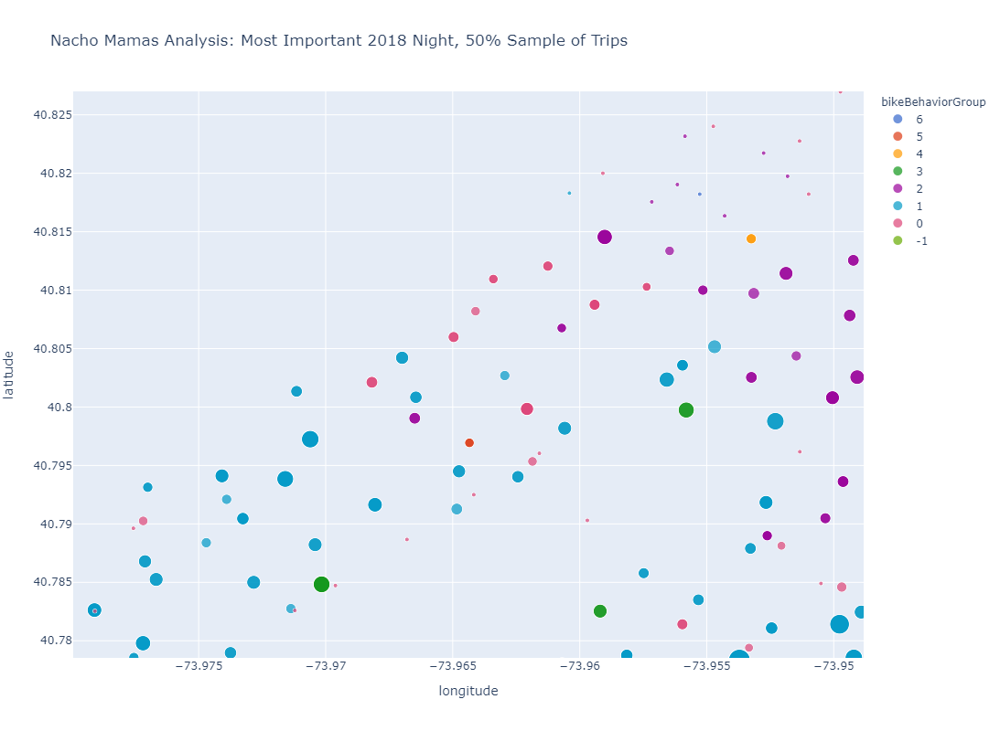

In [14]:
ls_MI_nachos = rank_nachos.vertices.orderBy(rank_nachos.vertices.pagerank.desc()).take(1631)
df_rankNachos= spark.createDataFrame(ls_MI_nachos).select('id','pagerank').withColumnRenamed("id","endStationName")

schema = StructType([
    StructField("endStationName", StringType(), True),
    StructField("latitude", DoubleType(), True),
    StructField("longitude", DoubleType(), True),
    StructField("bikeBehaviorGroup", IntegerType(), True)
])

df_NachoRank = df_stations.join(df_rankNachos, 'endStationName', 'left')

df_p_NachoRank = df_NachoRank.toPandas()
df_p_NachoRank.fillna(0.1, inplace=True)
df_p_NachoRank["bikeBehaviorGroup"] = df_p_NachoRank["bikeBehaviorGroup"].astype(int).astype(str)
df_p_NachoRank = df_p_NachoRank.sort_values(by='bikeBehaviorGroup', ascending=False)

#df_p_NachoRank['pagerank_MI'] = df_p_NachoRank['pagerank'].apply(lambda x: x * 1.2 if x >= 3 else 0.3)
# show the plot
fig = px.scatter(df_p_NachoRank, x = 'longitude', y = 'latitude', color='bikeBehaviorGroup', size='pagerank', color_discrete_sequence=px.colors.qualitative.G10,
                 hover_data=['bikeBehaviorGroup','endStationName'], height=800,  title='Nacho Mamas Analysis: Most Important 2018 Night, 50% Sample of Trips')
fig.write_image("50PercSample_2018Night_NachoAnalysis.png")
fig.show()

In [25]:
pd.options.display.max_columns = None
df_p.groupby('bikeBehaviorGroup').describe()

latitude                                             \
                     count       mean       std        min        25%   
bikeBehaviorGroup                                                       
-1                    32.0  40.766872  0.064773  40.655400  40.719014   
 0                   740.0  40.748055  0.064424  40.633385  40.697813   
 1                   297.0  40.737392  0.036060  40.661375  40.710446   
 2                   286.0  40.750750  0.062039  40.638246  40.693551   
 3                   146.0  40.740571  0.018475  40.703554  40.727477   
 4                    70.0  40.777109  0.060284  40.671907  40.699037   
 5                    37.0  40.784453  0.066483  40.642809  40.712774   
 6                    23.0  40.799012  0.055681  40.678600  40.783587   

                                                   longitude             \
                         50%        75%        max     count       mean   
bikeBehaviorGroup                                                         
-1                 40.752052  40.819385  40.872412      32.0 -73.972846   
 0                 40.744652  40.793737  40.874440     740.0 -73.957343   
 1                 40.733660  40.767627  40.818299     297.0 -73.977711   
 2                 40.751460  40.812062  40.864632     286.0 -73.945001   
 3                 40.739447  40.751900  40.799742     146.0 -73.989083   
 4                 40.809516  40.821941  40.844075      70.0 -73.933413   
 5                 40.821880  40.827629  40.862058      37.0 -73.926577   
 6                 40.822267  40.834139  40.869899      23.0 -73.915648   

                                                                         \
                        std        min        25%        50%        75%   
bikeBehaviorGroup                                                         
-1                 0.068456 -74.083639 -74.042996 -73.954682 -73.912485   
 0                 0.041891 -74.078900 -73.989763 -73.955776 -73.919618   
 1                 0.019589 -74.017134 -73.992919 -73.977550 -73.962434   
 2                 0.032346 -74.071061 -73.956869 -73.942093 -73.922312   
 3                 0.013013 -74.016518 -73.997506 -73.989706 -73.981174   
 4                 0.019726 -74.001947 -73.941614 -73.936277 -73.921460   
 5                 0.032701 -74.036486 -73.937948 -73.916930 -73.907451   
 6                 0.012994 -73.955277 -73.919202 -73.915026 -73.909676   

                             pagerank                                          \
                         max    count      mean       std       min       25%   
bikeBehaviorGroup                                                               
-1                -73.886445     32.0  0.390952  0.263797  0.100000  0.163103   
 0                -73.881876    740.0  0.536275  0.327072  0.100000  0.305961   
 1                -73.912555    297.0  1.670958  0.555532  0.723642  1.280205   
 2                -73.884308    286.0  0.819491  0.407029  0.100000  0.539573   
 3                -73.953345    146.0  2.689864  0.676162  1.771497  2.199124   
 4                -73.888271     70.0  0.732016  0.298168  0.163047  0.488923   
 5                -73.886659     37.0  0.588901  0.231645  0.100000  0.400208   
 6                -73.890413     23.0  0.592489  0.267511  0.250881  0.424556   

                                                pagerank_MI            \
                        50%       75%       max       count      mean   
bikeBehaviorGroup                                                       
-1                 0.306044  0.609065  0.910574        32.0  0.500000   
 0                 0.438917  0.698860  1.804625       740.0  0.500000   
 1                 1.591559  1.874521  5.687299       297.0  0.637066   
 2                 0.751045  1.013433  2.678361       286.0  0.500000   
 3                 2.501852  2.991555  5.106092       146.0  1.546524   
 4                 0.698260  0.916849  1.644850        70.0  0.500000   
 5           

In 2018 The closest Citi Bike station to Nacho Mama's was Amsterdam Ave & Morningside Dr. which belongs to Bike Beahvior Group 0. Group 0 appears to have these characteristics in comparison to other groups:


Bike Behavior Group 0 has a median rank of 0.4389, the Amsterdam Ave & Morningside Dr station has a page rank of 0.426. 

#### Observations:
While it has been reported by reputable sources that Nacho Mama's was a great restaurant, it does not appear that it's Citi Bike station has significantly increased ranks.
